Based on: https://aramislab.paris.inria.fr/workshops/DL4MI/2022/notebooks/GAN.html

In [ ]:
# torch stuff
import torch
from torch import nn
from torch.utils.data import DataLoader
import torch.nn.functional as F

# torchsummary and torchvision
from torchsummary import summary
from torchvision.utils import save_image

# matplotlib stuff
import matplotlib.pyplot as plt
import matplotlib.image as img

# numpy and pandas
import numpy as np
import pandas as pd

# Common python packages
import datetime
import os
import sys
import time
import nibabel as nib
import os
import torch
import cv2
from scipy import ndimage

## Data preparation

To import 10 subjects

In [ ]:
!gdown https://drive.google.com/uc?id=1haVKAPDpexp4_UhDt7tM3OJJfgtEuY_H
!unzip Data_set_10.zip

Downloading...
From (original): https://drive.google.com/uc?id=1haVKAPDpexp4_UhDt7tM3OJJfgtEuY_H
From (redirected): https://drive.google.com/uc?id=1haVKAPDpexp4_UhDt7tM3OJJfgtEuY_H&confirm=t&uuid=85757b6a-0cae-4589-a376-c68ce4615b9a
To: /content/Data_set_10.zip
100% 235M/235M [00:08<00:00, 28.2MB/s]
Archive:  Data_set_10.zip
  inflating: 1BA001/ct.nii.gz        
  inflating: 1BA001/mask.nii.gz      
  inflating: 1BA001/mr.nii.gz        
  inflating: 1BA005/ct.nii.gz        
  inflating: 1BA005/mask.nii.gz      
  inflating: 1BA005/mr.nii.gz        
  inflating: 1BA012/ct.nii.gz        
  inflating: 1BA012/mask.nii.gz      
  inflating: 1BA012/mr.nii.gz        
  inflating: 1BA014/ct.nii.gz        
  inflating: 1BA014/mask.nii.gz      
  inflating: 1BA014/mr.nii.gz        
  inflating: 1BA022/ct.nii.gz        
  inflating: 1BA022/mask.nii.gz      
  inflating: 1BA022/mr.nii.gz        
  inflating: 1BA032/ct.nii.gz        
  inflating: 1BA032/mask.nii.gz      
  inflating: 1BA032/mr.nii.

To import 20 subjects,
The 10 before are excluded.

In [ ]:
#!gdown https://drive.google.com/uc?id=10jVIQxr5FnftrB9HD1sLVvcpw4NMb0Zk
#!unzip Data_set_20.zip

The codes before the traning section must have all the same subject name, in this example, wou will see that i chose the subject 40 to do the image processing on. i suggest to load another subject so you can test it after the training.
You load the 5 codes before the traning section and change the subject name each time in the first one and the last 2 cells, and then you load the first one in the traning to save the torch_file containing the slices of each subject.

Res : [1. 1. 1.]

Shape : (210, 250, 189) <class 'tuple'>


<Figure size 640x480 with 0 Axes>

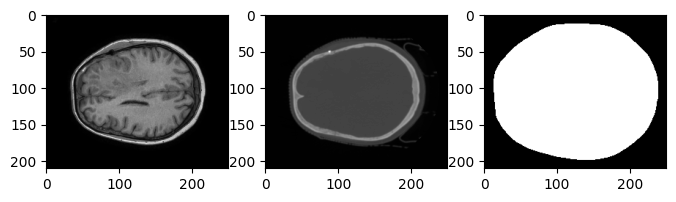

In [ ]:
subject_name = '1BA040/'

image_data_MR = nib.load(subject_name + 'mr.nii.gz') #
header_info_MR = image_data_MR.header
image_MR = np.array(image_data_MR.get_fdata())

image_data_CT = nib.load(subject_name + 'ct.nii.gz' )
image_CT = np.array(image_data_CT.get_fdata())

image_data_sc = nib.load(subject_name + 'mask.nii.gz' )
image_sc = np.array(image_data_sc.get_fdata())

print("Res :",header_info_MR['pixdim'][1:4])
print()
print("Shape :",image_CT.shape,type(image_CT.shape))

index = 128

plt.gray()
plt.figure(figsize=(8, 4))
plt.subplot(1, 3, 1)
plt.imshow(image_MR[:,:,index])
plt.subplot(1, 3, 2)
plt.imshow(image_CT[:,:,index])
plt.subplot(1, 3, 3)
plt.imshow(image_sc[:,:,index])


(256, 256, 189)


<Figure size 640x480 with 0 Axes>

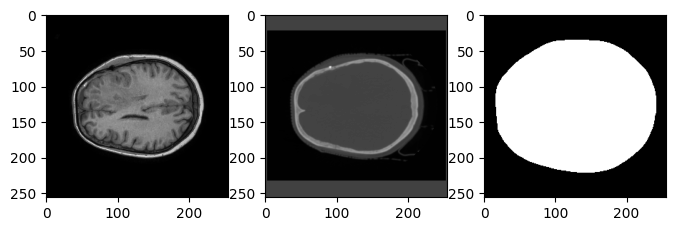

In [ ]:
Size_X= 256
Size_Y= 256
Size_Z=(image_sc.shape)[2]
image_pad_MR=np.zeros((Size_X,Size_Y,Size_Z))
image_pad_CT=np.zeros((Size_X,Size_Y,Size_Z))
image_pad_sc=np.zeros((Size_X,Size_Y,Size_Z))
for i in range (Size_Z):
    image_paded_MR = np.pad(image_MR[:,:,i], 100, 'constant')
    image_paded_CT = np.pad(image_CT[:,:,i],100, 'constant')
    image_paded_sc = np.pad(image_sc[:,:,i], 100, 'constant')
    #x,y=ndimage.measurements.center_of_mass(image_paded_sc) #Definiton de center of mass
    x,y= int(image_paded_MR.shape[0]/2),int(image_paded_MR.shape[1]/2)
    x,y=int(round(x)),int(round(y))
    xmin = x - int(Size_X/2)
    xmax = x + int(Size_X/2)
    ymin = y - int(Size_Y/2)
    ymax = y + int(Size_Y/2)

    image_pad_MR[:,:,i]=image_paded_MR[xmin:xmax,ymin:ymax]
    image_pad_CT[:,:,i]=image_paded_CT[xmin:xmax,ymin:ymax]
    image_pad_sc[:,:,i]=image_paded_sc[xmin:xmax,ymin:ymax]
index = 128
plt.gray()
plt.figure(figsize=(8, 4))
plt.subplot(1, 3, 1)
plt.imshow(image_pad_MR[:,:,index])
plt.subplot(1, 3, 2)
plt.imshow(image_pad_CT[:,:,index])
plt.subplot(1, 3, 3)
plt.imshow(image_pad_sc[:,:,index])
print(image_pad_sc.shape)



<Figure size 640x480 with 0 Axes>

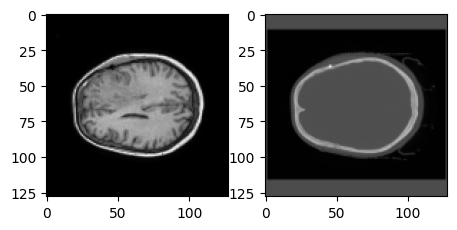

In [ ]:
Size_X= 128
Size_Y= 128
Size_Z=(image_sc.shape)[2]
image_resized_CT=np.zeros((Size_X,Size_Y,Size_Z))
image_resized_MR=np.zeros((Size_X,Size_Y,Size_Z))

for i in range (Size_Z):
    image_resized_MR[:,:,i] = cv2.resize(image_pad_MR[:,:,i] , (Size_X, Size_Y), interpolation = cv2.INTER_LINEAR)
    image_resized_CT[:,:,i] = cv2.resize(image_pad_CT[:,:,i] , (Size_X, Size_Y), interpolation = cv2.INTER_LINEAR)

plt.gray()
plt.figure(figsize=(8, 4))
plt.subplot(1, 3, 1)
plt.imshow(image_resized_MR[:,:,index])
plt.subplot(1, 3, 2)
plt.imshow(image_resized_CT[:,:,index])


In [ ]:

for slices in range (Size_Z):
    slic= image_resized_MR[:,:,slices]
    plt.gray()
  #  plt.figure(figsize=(4, 4))   #reactivate those lines to see the output
  #  plt.imshow(slic)

    path_database_out= ("torch_file/")
    if not os.path.exists(path_database_out):
      os.makedirs(path_database_out, exist_ok=True)

    image_final = cv2.normalize(slic, None, -1.0, 1.0,cv2.NORM_MINMAX, dtype=cv2.CV_32F)
    array=image_final
    x = torch.tensor(array)
    torch.save(x, path_database_out + 'sub-' +   str('40').zfill(2)  + "_" + str(slices).zfill(3)+ ' - MR.pt')

<Figure size 640x480 with 0 Axes>

In [ ]:
for slices in range (Size_Z):
    slic= image_resized_CT[:,:,slices]
    plt.gray()
   # plt.figure(figsize=(4, 4))  #reactivate those lines to see the output
   # plt.imshow(slic)

    path_database_out= ("torch_file/")
    image_final = cv2.normalize(slic, None, -1.0, 1.0,cv2.NORM_MINMAX, dtype=cv2.CV_32F)
    array=image_final
    x = torch.tensor(array)
    torch.save(x, path_database_out + 'sub-' +   str('40').zfill(2)  + "_" + str(slices).zfill(3)+ ' - CT.pt')
print (image_final.shape)

(128, 128)


<Figure size 640x480 with 0 Axes>

## Training

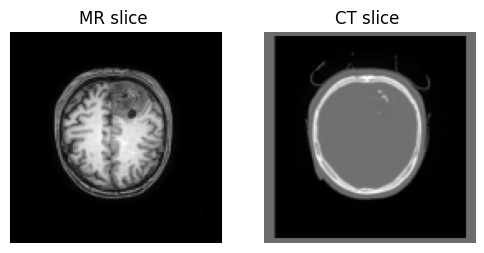

In [ ]:
root = ("./torch_file/")

plt.figure(figsize=(6, 4))
plt.subplot(1, 2, 1)
plt.imshow(np.swapaxes(torch.load(os.path.join(root, 'sub-01_158 - MR.pt')), 0, 1),
           cmap='gray', origin='lower')
plt.title("MR slice ")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(np.swapaxes(torch.load(os.path.join(root, 'sub-01_158 - CT.pt')), 0, 1),
           cmap='gray', origin='lower')
plt.title("CT slice ")
plt.axis('off')
plt.show()

In [ ]:
class DatasetMRCT (torch.utils.data.Dataset): # IXIDataset
    def __init__(self, root, mode="train"):

        files = sorted(os.listdir(root))
        patient_id = list(set([i.split()[0] for i in files]))

        imgs = []

        if mode == "train":
            for i in patient_id[:int(0.8 * len(patient_id))]:
                if (
                    os.path.isfile(os.path.join(root, i + " - MR.pt")) and
                    os.path.isfile(os.path.join(root, i + " - CT.pt"))
                ):
                    imgs.append((os.path.join(root, i + " - MR.pt"),
                                 os.path.join(root, i + " - CT.pt")))

        elif mode == "test":
            for i in patient_id[int(0.8 * len(patient_id)):]:
                if (
                    os.path.isfile(os.path.join(root, i + " - MR.pt")) and
                    os.path.isfile(os.path.join(root, i + " - CT.pt"))
                ):
                    imgs.append((os.path.join(root, i + " - MR.pt"),
                                 os.path.join(root, i + " - CT.pt")))

        self.imgs = imgs

    def __getitem__(self, index):
        path_MR, path_CT = self.imgs[index]

        P_MR = torch.load(path_MR)[None, :, :]
        P_CT = torch.load(path_CT)[None, :, :]

        return {"MR": P_MR, "CT": P_CT}

    def __len__(self):
        return len(self.imgs)

In [ ]:
# We provide classes for each block of the U-Net.

class UNetDown(nn.Module):
    """Descending block of the U-Net.

    Args:
        in_size: (int) number of channels in the input image.
        out_size : (int) number of channels in the output image.

    """
    def __init__(self, in_size, out_size):
        super(UNetDown, self).__init__()
        self.model = nn.Sequential(
            nn.Conv2d(in_size, out_size, kernel_size=3, stride=2, padding=1),
            nn.InstanceNorm2d(out_size),
            nn.LeakyReLU(0.2)
          )

    def forward(self, x):
        return self.model(x)


class UNetUp(nn.Module):
    """Ascending block of the U-Net.

    Args:
        in_size: (int) number of channels in the input image.
        out_size : (int) number of channels in the output image.

    """
    def __init__(self, in_size, out_size):
        super(UNetUp, self).__init__()
        self.model = nn.Sequential(
            nn.ConvTranspose2d(in_size, out_size, kernel_size=4,
                               stride=2, padding=1),
            nn.InstanceNorm2d(out_size),
            nn.ReLU(inplace=True)
        )

    def forward(self, x, skip_input=None):
        if skip_input is not None:
            x = torch.cat((x, skip_input), 1)  # add the skip connection
        x = self.model(x)
        return x


class FinalLayer(nn.Module):
    """Final block of the U-Net.

    Args:
        in_size: (int) number of channels in the input image.
        out_size : (int) number of channels in the output image.

    """
    def __init__(self, in_size, out_size):
        super(FinalLayer, self).__init__()
        self.model = nn.Sequential(
            nn.Upsample(scale_factor=2),
            nn.Conv2d(in_size, out_size, kernel_size=3, padding=1),
            nn.Tanh(),
        )

    def forward(self, x, skip_input=None):
        if skip_input is not None:
            x = torch.cat((x, skip_input), 1)
        x = self.model(x)
        return x

In [ ]:
class GeneratorUNet(nn.Module):
    def __init__(self, in_channels=1, out_channels=1):
        super(GeneratorUNet, self).__init__()

        self.down1 = UNetDown(in_channels, 64)
        self.down2 = UNetDown(64, 128)
        self.down3 = UNetDown(128, 256)
        self.down4 = UNetDown(256, 512)
        self.down5 = UNetDown(512, 512)

        self.up1 = UNetUp(512, 512)
        self.up2 = UNetUp(1024, 256)
        self.up3 = UNetUp(512, 128)
        self.up4 = UNetUp(256, 64)

        self.final = FinalLayer(128, 1)

    def forward(self, x):
        d1 = self.down1(x)
        d2 = self.down2(d1)
        d3 = self.down3(d2)
        d4 = self.down4(d3)
        d5 = self.down5(d4)

        u1 = self.up1(d5)
        u2 = self.up2(u1, d4)
        u3 = self.up3(u2, d3)
        u4 = self.up4(u3, d2)

        return self.final(u4, d1)

In [ ]:
# Summary of the generator

summary(GeneratorUNet().cuda(), (1, 128, 128) )  # run this if on google colab and using a GPU
# summary(GeneratorUNet(), (1, 128, 128) )  # run this if using the CPU only

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 64, 64]             640
    InstanceNorm2d-2           [-1, 64, 64, 64]               0
         LeakyReLU-3           [-1, 64, 64, 64]               0
          UNetDown-4           [-1, 64, 64, 64]               0
            Conv2d-5          [-1, 128, 32, 32]          73,856
    InstanceNorm2d-6          [-1, 128, 32, 32]               0
         LeakyReLU-7          [-1, 128, 32, 32]               0
          UNetDown-8          [-1, 128, 32, 32]               0
            Conv2d-9          [-1, 256, 16, 16]         295,168
   InstanceNorm2d-10          [-1, 256, 16, 16]               0
        LeakyReLU-11          [-1, 256, 16, 16]               0
         UNetDown-12          [-1, 256, 16, 16]               0
           Conv2d-13            [-1, 512, 8, 8]       1,180,160
   InstanceNorm2d-14            [-1, 51

In [ ]:
def mean_absolute_error(image_true, image_generated):
    """Compute mean absolute error.

    Args:
        image_true: (Tensor) true image
        image_generated: (Tensor) generated image

    Returns:
        mse: (float) mean squared error
    """
    return torch.abs(image_true - image_generated).mean()


def peak_signal_to_noise_ratio(image_true, image_generated):
    """"Compute peak signal-to-noise ratio.

    Args:
        image_true: (Tensor) true image
        image_generated: (Tensor) generated image

    Returns:
        psnr: (float) peak signal-to-noise ratio"""
    mse = ((image_true - image_generated) ** 2).mean().cpu()
    return -10 * np.log10(mse)


def structural_similarity_index(image_true, image_generated, C1=0.01, C2=0.03):
    """Compute structural similarity index.

    Args:
        image_true: (Tensor) true image
        image_generated: (Tensor) generated image
        C1: (float) variable to stabilize the denominator
        C2: (float) variable to stabilize the denominator

    Returns:
        ssim: (float) mean squared error"""
    mean_true = image_true.mean()
    mean_generated = image_generated.mean()
    std_true = image_true.std()
    std_generated = image_generated.std()
    covariance = (
        (image_true - mean_true) * (image_generated - mean_generated)).mean()

    numerator = (2 * mean_true * mean_generated + C1) * (2 * covariance + C2)
    denominator = ((mean_true ** 2 + mean_generated ** 2 + C1) *
                   (std_true ** 2 + std_generated ** 2 + C2))
    return numerator / denominator

In [ ]:
def evaluate_generator(generator):
    """Evaluate a generator.

    Args:
        generator: (GeneratorUNet) neural network generating  images

    """
    res_train, res_test = [], []

    cuda = True if torch.cuda.is_available() else False
    Tensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor

    with torch.no_grad():

        for i, batch in enumerate(train_loader):

            real_MR = batch["MR"].type(Tensor)
            real_CT = batch["CT"].type(Tensor)
            fake_CT = generator(real_MR)

            mae = mean_absolute_error(real_CT, fake_CT).item()
            psnr = peak_signal_to_noise_ratio(real_CT, fake_CT).item()
            ssim = structural_similarity_index(real_CT, fake_CT).item()

            res_train.append([mae, psnr, ssim])

        for i, batch in enumerate(test_loader):

            real_MR = batch["MR"].type(Tensor)
            real_CT = batch["CT"].type(Tensor)
            fake_CT = generator(real_MR)

            mae = mean_absolute_error(real_CT, fake_CT).item()
            psnr = peak_signal_to_noise_ratio(real_CT, fake_CT).item()
            ssim = structural_similarity_index(real_CT, fake_CT).item()

            res_test.append([mae, psnr, ssim])

        df = pd.DataFrame([
            pd.DataFrame(res_train, columns=['MAE', 'PSNR', 'SSIM']).mean().squeeze(),
            pd.DataFrame(res_test, columns=['MAE', 'PSNR', 'SSIM']).mean().squeeze()
        ], index=['Training set', 'Test set']).T
    return df

In [ ]:
# We provide a function to generate a block for the given architecture.
def discriminator_block(in_filters, out_filters):
    """Return downsampling layers of each discriminator block"""
    layers = [nn.Conv2d(in_filters, out_filters, 3, stride=2, padding=1)]
    layers.append(nn.LeakyReLU(0.2, inplace=True))
    return nn.Sequential(*layers)


class Discriminator(nn.Module):
    def __init__(self, in_channels=1):
        super(Discriminator, self).__init__()
        self.layers = nn.Sequential(
            discriminator_block(in_channels*2, 64),
            discriminator_block(64, 128),
            discriminator_block(128, 256),
            discriminator_block(256, 512),
            discriminator_block(512, 1024),
            nn.Conv2d(1024, 1, 1, stride=4, padding=0),
        )


    def forward(self, img_A, img_B):
        # Concatenate image and condition image by channels to produce input
        img_input = torch.cat((img_A, img_B), 1)
        return self.layers(img_input)

In [ ]:
      # Summary of the discriminator

summary(Discriminator().cuda(), [(1, 128, 128), (1, 128, 128)])
#summary(Discriminator(), [(1, 128, 128), (1, 128, 128)])

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 64, 64]           1,216
         LeakyReLU-2           [-1, 64, 64, 64]               0
            Conv2d-3          [-1, 128, 32, 32]          73,856
         LeakyReLU-4          [-1, 128, 32, 32]               0
            Conv2d-5          [-1, 256, 16, 16]         295,168
         LeakyReLU-6          [-1, 256, 16, 16]               0
            Conv2d-7            [-1, 512, 8, 8]       1,180,160
         LeakyReLU-8            [-1, 512, 8, 8]               0
            Conv2d-9           [-1, 1024, 4, 4]       4,719,616
        LeakyReLU-10           [-1, 1024, 4, 4]               0
           Conv2d-11              [-1, 1, 1, 1]           1,025
Total params: 6,271,041
Trainable params: 6,271,041
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 1024.00
F

In [ ]:
def train_cgan(train_loader, test_loader, num_epoch=500,
               lr=0.0001, beta1=0.9, beta2=0.999):
    """Train a conditional GAN.

    Args:
        train_loader: (DataLoader) a DataLoader wrapping a the training dataset
        test_loader: (DataLoader) a DataLoader wrapping a the test dataset
        num_epoch: (int) number of epochs performed during training
        lr: (float) learning rate of the discriminator and generator Adam optimizers
        beta1: (float) beta1 coefficient of the discriminator and generator Adam optimizers
        beta2: (float) beta1 coefficient of the discriminator and generator Adam optimizers

    Returns:
        generator: (nn.Module) the trained generator
    """

    cuda = True if torch.cuda.is_available() else False
    print(f"Using cuda device: {cuda}")  # check if GPU is used

    # Tensor type (put everything on GPU if possible)
    Tensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor

    # Output folder
    if not os.path.exists("./images/cgan"):
        os.makedirs("./images/cgan")

    # Loss functions
    criterion_GAN = torch.nn.BCEWithLogitsLoss()  # A loss adapted to binary classification like torch.nn.BCEWithLogitsLoss
    criterion_pixelwise = torch.nn.L1Loss()  # A loss for a voxel-wise comparison of images like torch.nn.L1Loss

    lambda_GAN = 1.  # Weights criterion_GAN in the generator loss
    lambda_pixel = 1.  # Weights criterion_pixelwise in the generator loss

    # Initialize generator and discriminator
    generator = GeneratorUNet()
    discriminator = Discriminator()

    if cuda:
        generator = generator.cuda()
        discriminator = discriminator.cuda()
        criterion_GAN.cuda()
        criterion_pixelwise.cuda()

    # Optimizers
    optimizer_generator = torch.optim.Adam(
        generator.parameters(), lr=lr, betas=(beta1, beta2))
    optimizer_discriminator = torch.optim.Adam(
        discriminator.parameters(), lr=lr, betas=(beta1, beta2))

    def sample_images(epoch):
        """Saves a generated sample from the validation set"""
        imgs = next(iter(test_loader))
        real_MR = imgs["MR"].type(Tensor)
        real_CT = imgs["CT"].type(Tensor)
        fake_CT = generator(real_MR)
        img_sample = torch.cat((real_MR.data, fake_CT.data, real_CT.data), -2)
        save_image(img_sample, f"./images/cgan/epoch-{epoch}.png",
                   nrow=5, normalize=True)

    # ----------
    #  Training
    # ----------

    prev_time = time.time()
###
    loss_discri = []
    loss_gener = []
    loss_pix = []
    loss_gan = []
###
    for epoch in range(num_epoch):
        for i, batch in enumerate(train_loader):

            real_MR = batch["MR"].type(Tensor)
            real_CT = batch["CT"].type(Tensor)

            # Create labels
            valid = Tensor(np.ones((real_CT.size(0), 1, 1, 1)))
            fake = Tensor(np.zeros((real_CT.size(0), 1, 1, 1)))

            # -----------------
            #  Train Generator
            # -----------------
            optimizer_generator.zero_grad()

            # GAN loss
            fake_CT = generator(real_MR)
            pred_fake = discriminator(fake_CT, real_MR)
            loss_GAN = criterion_GAN(pred_fake, valid)

            # L1 loss
            loss_pixel = criterion_pixelwise(fake_CT, real_CT)

            # Total loss
            loss_generator = lambda_GAN * loss_GAN + lambda_pixel * loss_pixel

            # Compute the gradient and perform one optimization step
            loss_generator.backward()
            optimizer_generator.step()

            # ---------------------
            #  Train Discriminator
            # ---------------------

            optimizer_discriminator.zero_grad()

            # Real loss
            pred_real = discriminator(real_CT, real_MR)
            loss_real = criterion_GAN(pred_real, valid)

            # Fake loss
            fake_CT = generator(real_MR)
            pred_fake = discriminator(fake_CT.detach(), real_MR)
            loss_fake = criterion_GAN(pred_fake, fake)

            # Total loss
            loss_discriminator = 0.5 * (loss_real + loss_fake)

            # Compute the gradient and perform one optimization step
            loss_discriminator.backward()
            optimizer_discriminator.step()

            # --------------
            #  Log Progress
            # --------------

            # Determine approximate time left
            batches_done = epoch * len(train_loader) + i
            batches_left = num_epoch * len(train_loader) - batches_done
            time_left = datetime.timedelta(
                seconds=batches_left * (time.time() - prev_time))
            prev_time = time.time()

            ###

            loss_discri.append(loss_discriminator)
            loss_gener.append(loss_generator)
            loss_pix.append(loss_pixel)
            loss_gan.append(loss_GAN)
            ###
            # Print log
            sys.stdout.write(
                "\r[Epoch %d/%d] [Batch %d/%d] [D loss: %f] "
                "[G loss: %f, pixel: %f, adv: %f] ETA: %s"
                % (
                    epoch + 1,
                    num_epoch,
                    i,
                    len(train_loader),
                    loss_discriminator.item(),
                    loss_generator.item(),
                    loss_pixel.item(),
                    loss_GAN.item(),
                    time_left,
                )
            )

        # Save images at the end of each epoch
        sample_images(epoch)

    return generator, loss_discri, loss_gener, loss_pix, loss_gan

Here you define the hyperparameters you will be using for the training, I suggest to keep the batch size around 4-8 and start with low epochs nb to see the convergence of the model. Later, you can add more subjects to the training and edit the epochs nb. I also suggest to not change the learning rate at first.

In [ ]:
# Create dataloaders
batch_size = 4
train_loader = DataLoader(DatasetMRCT(root, mode="train"),
                          batch_size=batch_size,
                          shuffle=True)

test_loader = DataLoader(DatasetMRCT(root, mode="test"),
                         batch_size=5,
                         shuffle=False)
# Number of epochs
num_epoch = 400
# Parameters for Adam optimizer
lr = 0.0002
beta1 = 0.5
beta2 = 0.999

Here starts the training:

In [ ]:
generator_cgan, loss_discri, loss_gener, loss_pix, loss_gan = train_cgan(train_loader, test_loader, num_epoch=num_epoch,
                            lr=lr, beta1=beta1, beta2=beta2)

Using cuda device: True


<ipython-input-25-384d98b18a25>:78: UserWarning: The torch.cuda.*DtypeTensor constructors are no longer recommended. It's best to use methods such as torch.tensor(data, dtype=*, device='cuda') to create tensors. (Triggered internally at ../torch/csrc/tensor/python_tensor.cpp:78.)
  valid = Tensor(np.ones((real_CT.size(0), 1, 1, 1)))


[Epoch 400/400] [Batch 81/82] [D loss: 0.964643] [G loss: 0.217554, pixel: 0.022589, adv: 0.194965] ETA: 0:00:00.041749

To see the convergence and the model loss:
The GAN loss is actually the sum of the previous losses

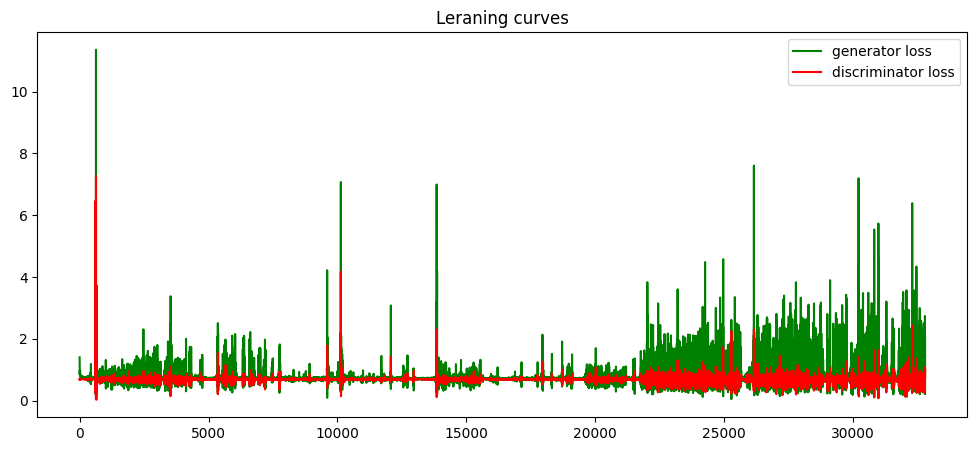

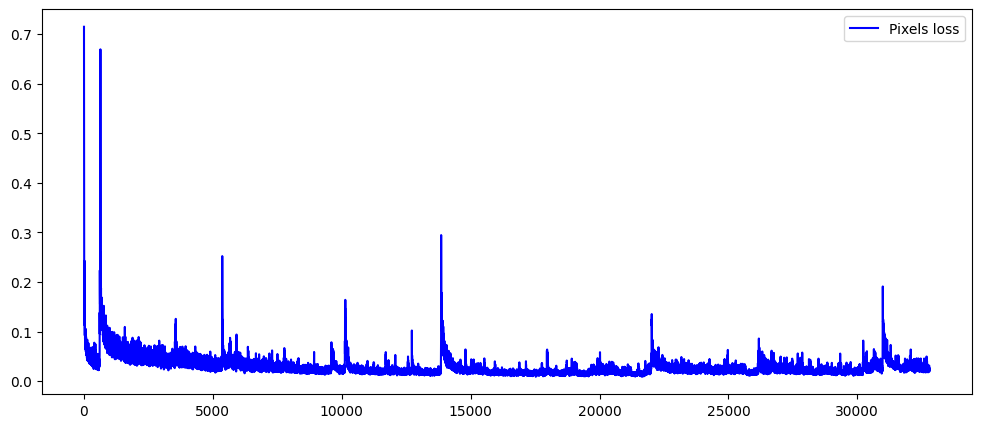

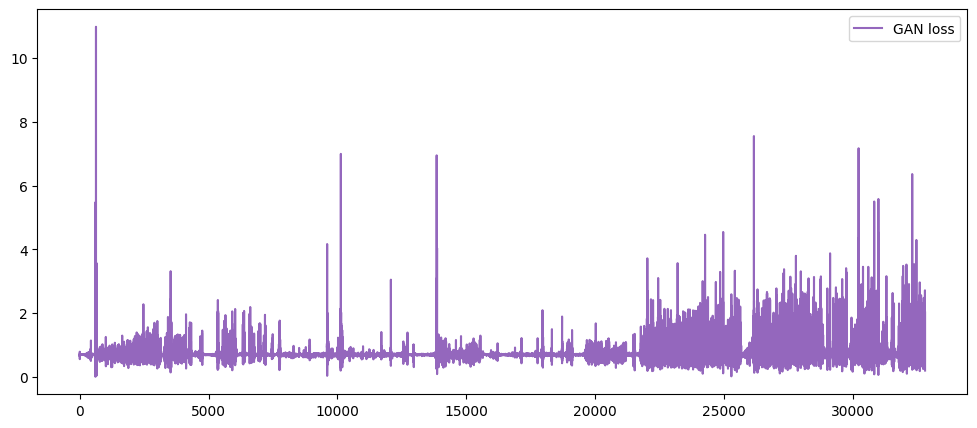

In [ ]:
# Learing curves
a = []
b = []
c = []
d = []
for i in range (len(loss_discri)):
    a.append(np.array(loss_discri[i].detach().cpu()))
    b.append(np.array(loss_gener[i].detach().cpu()))
    c.append(np.array(loss_pix[i].detach().cpu()))
    d.append(np.array(loss_gan[i].detach().cpu()))

plt.figure(figsize=(12,5))
plt.title('Leraning curves')
plt.plot(b ,  color='g', label='generator loss')
plt.plot(a ,  color='r', label='discriminator loss')
plt.legend()
plt.show()
plt.figure(figsize=(12,5))
plt.plot(c  ,  color='b', label='Pixels loss')
plt.legend()
plt.show()
plt.figure(figsize=(12,5))
plt.plot(d  ,  color='C4', label='GAN loss')
plt.legend()
plt.show()

Validation test on the 20% of the initial data that the model didn't see.

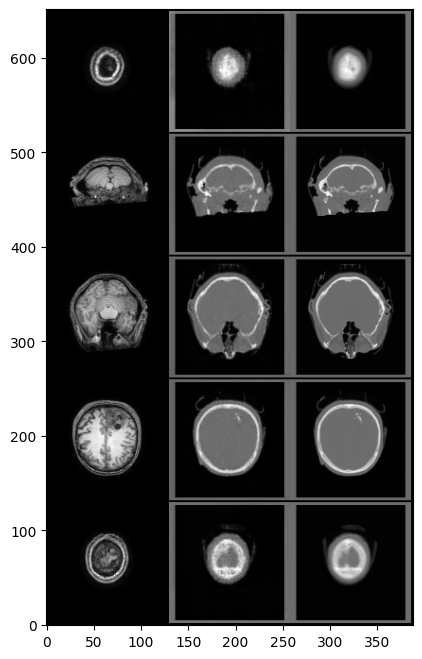

In [ ]:
plt.figure(figsize=(8, 8))
im = img.imread(f'./images/cgan/epoch-{num_epoch - 1}.png')
plt.imshow(np.swapaxes(im, 0, 1))
plt.gca().invert_yaxis()
plt.show()

The evaluation merics of the training

In [ ]:
evaluate_generator(generator_cgan)

,Training set,Test set
MAE,0.020724,0.022401
PSNR,27.556765,26.728095
SSIM,0.996145,0.995266


To save the weights, i suggest to save it in convention of the epochs nb, the batch size and the subject number. for example, if you ran on 100 epochs, with a batch size of 5 and on 10 subjects, save it as : generator_mri_to_ct_100ep_b5_10sub.pt
This code will save it in the Files on the left, then download it to save it locally

In [ ]:
torch.save(generator_cgan, 'generator_mri_to_ct_400ep_b4_sub01.pt')

In case you want to open a pretrained model with another weights, you can run one of those lines dependetnly wether youa re running on you CPU or google Colab

In [ ]:
# To open a pre trained model

#generator_cgan = torch.load('generator_mri_to_ct_100ep_b10.pt', map_location=torch.device('cpu'))  # in case of running on CPU
#generator_cgan = generator_cgan.to(device='cuda')  # in case running on google colab and connected to a GPU

This cell is made to test the imported model or the last trained one on data that are in the path mentioned below that have to be already in the torch_file.

Text(0.5, 1.0, 'true')

<Figure size 640x480 with 0 Axes>

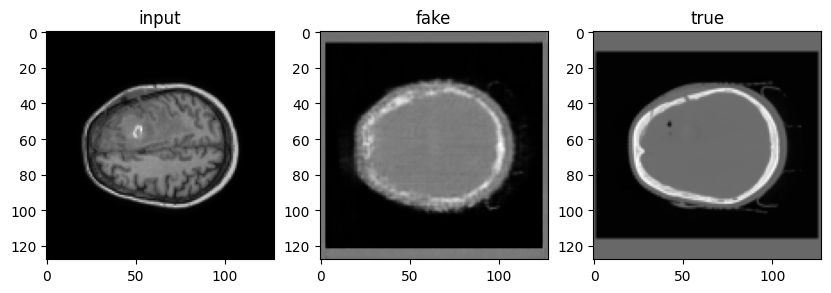

In [ ]:
cuda = True if torch.cuda.is_available() else False
Tensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor
patch = "torch_file/"

imag_test=torch.load(os.path.join(patch, 'sub-40_141 - MR.pt'))
imag_true=torch.load(os.path.join(patch, 'sub-40_141 - CT.pt'))
#imgs = next(iter(test_loaders))
imag_test = imag_test[None, None, :]
real = imag_test.type(Tensor)
fake = generator_cgan(real)
fake=fake[0,0,:,:].cpu().detach().numpy()
plt.gray()
plt.figure(figsize=(10, 4))
plt.subplot(1, 3, 1)
plt.imshow(real[0,0,:,:].cpu().detach().numpy() )
plt.title("input")
#plt.show()
#fake_B=fake_B.Tensor.cpu()
plt.subplot(1, 3, 2)
plt.imshow(fake)
plt.title("fake")
#plt.show()
#fake_B=fake_B.Tensor.cpu()
plt.subplot(1, 3, 3)
plt.imshow(imag_true[:,:].cpu().detach().numpy() )
plt.title("true")

# Test on External data

In [ ]:
image_data_LE = nib.load( '1BA054/mr.nii.gz' )
header_info_LE = image_data_LE.header
image_MRMP2RAGE = np.array(image_data_LE.get_fdata())

max_pixel = np.max(image_MRMP2RAGE)
print (image_MRMP2RAGE.shape , "  / max value = " , max_pixel)

(231, 258, 224)   / max value =  2662.64453125


(531, 558, 224)


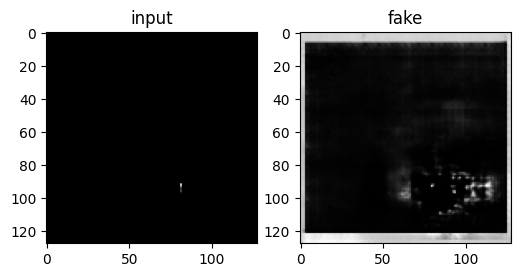

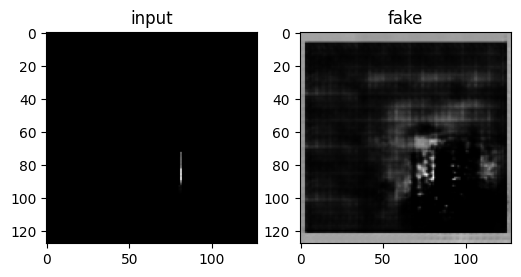

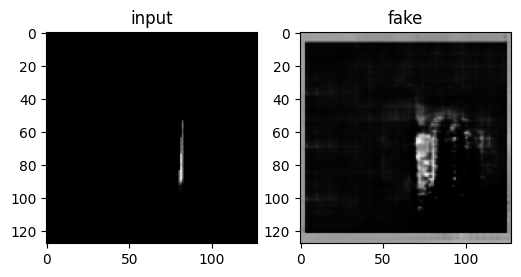

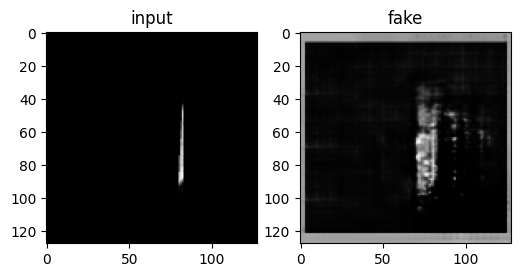

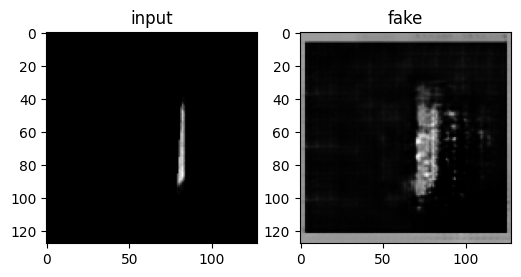

...

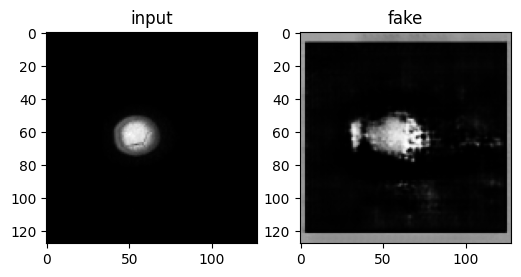

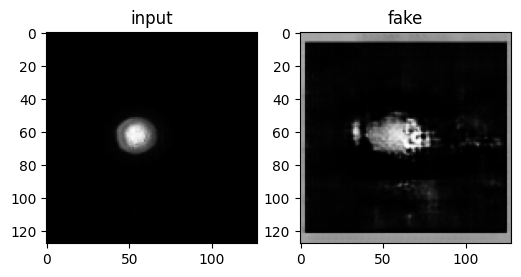

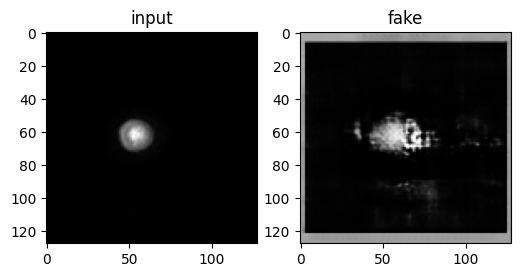

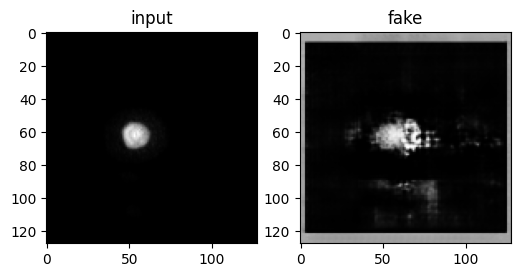

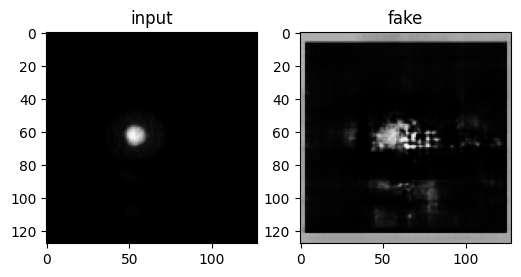

In [ ]:
generator_cgan = generator_cgan

Size_X= 256
Size_Y= 256
Size_Z=(image_MRMP2RAGE.shape)[2]
image_pad_MRMP2RAGE=np.zeros((Size_X,Size_Y,Size_Z))
image_pad_128=np.zeros((128,128,Size_Z))

padding_x_y = ((150, 150), (150, 150), (0, 0))
image_paded_MRMP2RAGE = np.pad(image_MRMP2RAGE, padding_x_y , 'constant')
image_paded_center = np.zeros(image_paded_MRMP2RAGE.shape)
print (image_paded_MRMP2RAGE.shape)

for i in range (Size_Z ):
    x,y= int(image_paded_MRMP2RAGE.shape[0]/2),int(image_paded_MRMP2RAGE.shape[1]/2)
    x,y=int(round(x)),int(round(y))
    xmin = x - 128
    xmax = x + 128
    ymin = y - 128
    ymax = y + 128
    array_256 =image_paded_MRMP2RAGE[xmin:xmax,ymin:ymax,i]
    array = cv2.resize(array_256 , (128, 128), interpolation = cv2.INTER_LINEAR)
    x = torch.tensor(array)
    x_new = x[None, None, :]
    Size_X=(x_new.shape)[2]
    Size_Y=(x_new.shape)[3]
    Size_Z= 1
    d = generator_cgan(x_new[:,:,:].type(Tensor)).cpu().detach().numpy()
    image_pad_128[:,:,i]=d
    plt.figure(figsize=(6, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(x_new[0,0,:,:])
    plt.title("input")
    plt.subplot(1, 2, 2)
    plt.imshow((image_pad_128[:,:,i]))
    plt.title("fake")
    plt.show()

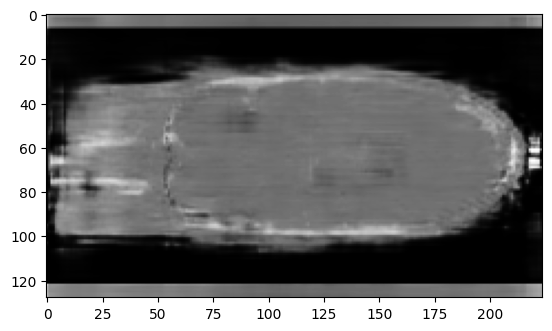

In [ ]:
plt.imshow((image_pad_128[:,70,:]))

# Save as nii

In [ ]:
image_save_original = np.zeros((image_MR.shape[0],image_MR.shape[1],image_MRMP2RAGE.shape[2]))
for i in range (image_MRMP2RAGE.shape[2]):
  image_save_256 = cv2.resize(image_pad_128[:,:,i] , (256, 256), interpolation = cv2.INTER_LINEAR)
  image_256_padded = np.pad(image_save_256, 60, 'constant')
  x,y= int(image_256_padded.shape[0]/2),int(image_256_padded.shape[1]/2)
  xmin = x - int(image_MR.shape[0]/2)
  xmax = x + int(image_MR.shape[0]/2)
  ymin = y - int(image_MR.shape[1]/2)
  ymax = y + int(image_MR.shape[1]/2)
  image_save_original[:,:,i]=image_256_padded[xmin:xmax,ymin:ymax]
img_normalized = cv2.normalize(image_save_original, None, -1024, 3000, cv2.NORM_MINMAX, dtype=cv2.CV_32F)

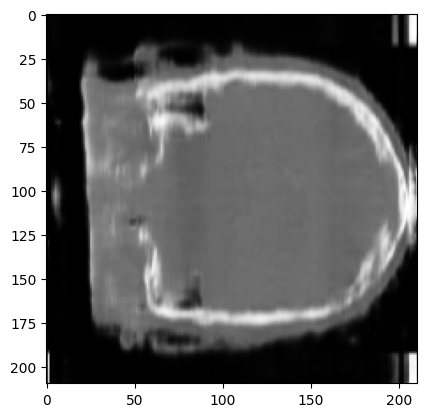

In [ ]:
plt.imshow((img_normalized[:,140,:]))

In [ ]:
LE = nib.Nifti1Image(img_normalized, image_data_LE.affine)
nib.save(LE,  'CT_fake_400ep_b4_1sub_ext.nii.gz' )

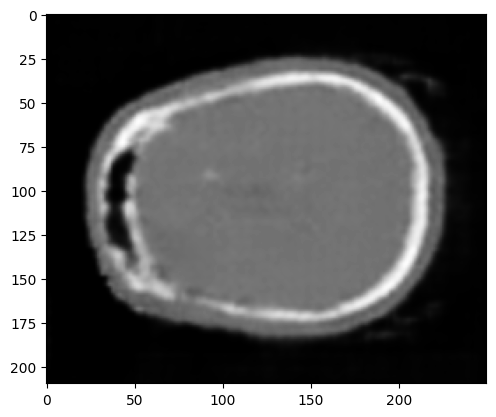

In [ ]:
plt.imshow((img_normalized[:,:,140]))